#Data Engineer Task

#Downloading required libraries

In [ ]:
!pip install pandas-profiling

In [ ]:
!pip install klib

#Step 1: Data Exploration

Importing libraries

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import klib
sns.set()

Getting provided excel data to pandas dataframe

In [ ]:
df = pd.read_csv("US_Accidents_Dec21_updated.csv")

Displaying first 5 rows of data

In [ ]:
df.head()

,Device ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-866133,2,19-12-2021 01:05,19-12-2021 01:25,41.205620,-73.808760,41.212708,-73.809480,0.491,Stationary traffic on Taconic State Pkwy N fro...,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-11577,2,16-06-2016 06:41,16-06-2016 12:41,34.119940,-118.090660,34.119940,-118.090660,0.000,At Vista St - Accident.,...,False,False,False,False,False,False,Day,Day,Day,Day
2,A-387467,2,15-12-2021 17:59,15-12-2021 18:31,41.287347,-122.298189,41.270896,-122.200958,5.175,Slow traffic on CA-89 from I-5 (CA-89) to Broa...,...,False,False,False,False,False,False,Night,Night,Night,Day
3,A-1038456,2,20-09-2021 21:33,21-09-2021 00:02,33.362996,-117.227618,33.363682,-117.227633,0.047,Accident from CR-S13/S Mission Rd (S Stagecoac...,...,False,False,False,False,False,False,Night,Night,Night,Night
4,A-19248,2,11-11-2016 00:47,11-11-2016 06:47,45.083120,-93.053070,45.075800,-93.052780,0.506,At CR-96/Exit 117 - Accident.,...,False,False,False,False,False,False,Night,Night,Night,Night


Displaying overview like data type of each column



*   There are 47 features where most of them have int and float data type
* we have total 58270 observations.


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58270 entries, 0 to 58269
Data columns (total 47 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Device ID              58270 non-null  object 
 1   Severity               58270 non-null  int64  
 2   Start_Time             58270 non-null  object 
 3   End_Time               58270 non-null  object 
 4   Start_Lat              58270 non-null  float64
 5   Start_Lng              58270 non-null  float64
 6   End_Lat                58270 non-null  float64
 7   End_Lng                58270 non-null  float64
 8   Distance(mi)           58270 non-null  float64
 9   Description            58270 non-null  object 
 10  Number                 24109 non-null  float64
 11  Street                 58270 non-null  object 
 12  Side                   58270 non-null  object 
 13  City                   58269 non-null  object 
 14  County                 58270 non-null  object 
 15  St

#Step 2: Preliminary Data Analysis

Here I have used exploratory data analysis (eda) to get to know more about data

* Used auto eda library Pandas Profiling

In [ ]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df,explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Findings of above EDA

Found 2 features which has constant value, which are:

* Country has constant value "US"	
 
* Turning_Loop has constant value "False"

For model building we dont required this features who has constant value as it would redundant for training

Found 11 Features contains missing values which are:


* Number has 34161 (58.6%) missing values	Missing
* Weather_Timestamp has 840 (1.4%) missing values	
* Temperature(F) has 1184 (2.0%) missing values	
* Wind_Chill(F) has 11952 (20.5%) missing values	
* Humidity(%) has 1236 (2.1%) missing values	
* Pressure(in) has 1000 (1.7%) missing values	
* Visibility(mi) has 1239 (2.1%) missing values	
* Wind_Direction has 1259 (2.2%) missing values	
* Wind_Speed(mph) has 3288 (5.6%) missing values	
* Precipitation(in) has 13026 (22.4%) missing values	
* Weather_Condition has 1239 (2.1%) missing values

  
  


  


Performing data cleaning process

In [ ]:
df_clean = klib.data_cleaning(df)

Shape of cleaned data: (58270, 45) - Remaining NAs: 71111


Dropped rows: 0
     of which 0 duplicates. (Rows (first 150 shown): [])

Dropped columns: 2
     of which 2 single valued.     Columns: ['country', 'turning_loop']
Dropped missing values: 0
Reduced memory by at least: 7.19 MB (-45.39%)



As you see all data types are changed

In [ ]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58270 entries, 0 to 58269
Data columns (total 45 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   device_id              58270 non-null  string  
 1   severity               58270 non-null  int8    
 2   start_time             58270 non-null  string  
 3   end_time               58270 non-null  string  
 4   start_lat              58270 non-null  float32 
 5   start_lng              58270 non-null  float32 
 6   end_lat                58270 non-null  float32 
 7   end_lng                58270 non-null  float32 
 8   distance_mi            58270 non-null  float32 
 9   description            58270 non-null  string  
 10  number                 24109 non-null  float32 
 11  street                 58270 non-null  string  
 12  side                   58270 non-null  category
 13  city                   58269 non-null  string  
 14  county                 58270 non-null 

Checking if there are any null values in all features

In [ ]:
df_clean.isnull().sum()

device_id                    0
severity                     0
start_time                   0
end_time                     0
start_lat                    0
start_lng                    0
end_lat                      0
end_lng                      0
distance_mi                  0
description                  0
number                   34161
street                       0
side                         0
city                         1
county                       0
state                        0
zipcode                     34
timezone                    68
airport_code               208
weather_timestamp          840
temperature_f             1184
wind_chill_f             11952
humidity_percent          1236
pressure_in               1000
visibility_mi             1239
wind_direction            1259
wind_speed_mph            3288
precipitation_in         13026
weather_condition         1239
amenity                      0
bump                         0
crossing                     0
give_way

Checking if there are outliers in given features

It will helps us to choose which measures of central tendancy should we use to replace null values

<Axes: >

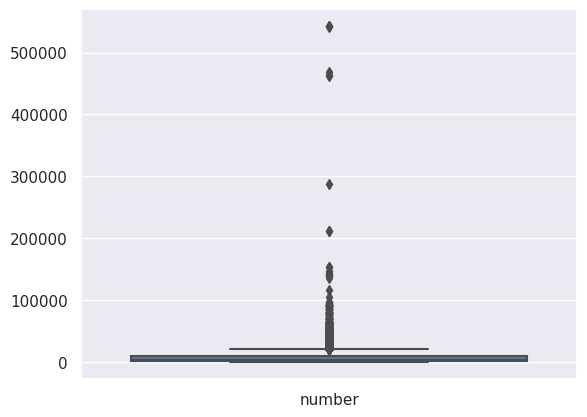

In [ ]:
sns.boxplot(df_clean[['number']])

Replacing null values with median

most of the features with null values consists of outliers so we will use median to replace outlier

The reason we are using median instead of mean, as mean is affected by outliers.

In [ ]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan,strategy = 'median')
df_clean[['number']] = imputer.fit_transform(df_clean[['number']])
df_clean[['temperature_f']] = imputer.fit_transform(df_clean[['temperature_f']])
df_clean[['wind_chill_f']] = imputer.fit_transform(df_clean[['wind_chill_f']])
df_clean[['humidity_percent']] = imputer.fit_transform(df_clean[['humidity_percent']])
df_clean[['pressure_in']] = imputer.fit_transform(df_clean[['pressure_in']])
df_clean[['visibility_mi']] = imputer.fit_transform(df_clean[['visibility_mi']])
df_clean[['wind_speed_mph']] = imputer.fit_transform(df_clean[['wind_speed_mph']])
df_clean[['precipitation_in']] = imputer.fit_transform(df_clean[['precipitation_in']])

Here we will remove those records which consists of few null values

In [ ]:
df_clean.dropna(axis = 0, inplace=True)

As you see our dataset is cleaned and ready to procced further

In [ ]:
df_clean.isnull().sum()

device_id                0
severity                 0
start_time               0
end_time                 0
start_lat                0
start_lng                0
end_lat                  0
end_lng                  0
distance_mi              0
description              0
number                   0
street                   0
side                     0
city                     0
county                   0
state                    0
zipcode                  0
timezone                 0
airport_code             0
weather_timestamp        0
temperature_f            0
wind_chill_f             0
humidity_percent         0
pressure_in              0
visibility_mi            0
wind_direction           0
wind_speed_mph           0
precipitation_in         0
weather_condition        0
amenity                  0
bump                     0
crossing                 0
give_way                 0
junction                 0
no_exit                  0
railway                  0
roundabout               0
s

Saving the transformed data to csv

In [ ]:
df_clean.to_csv("transformed_data.csv", index=False)